1/1 [==============================] - 1s 639ms/step


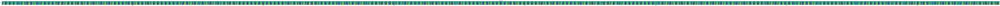

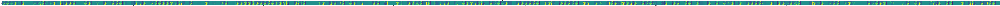

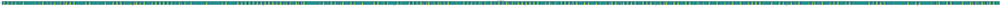

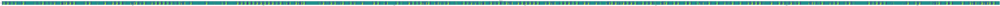

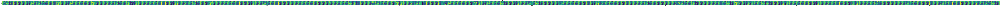

...

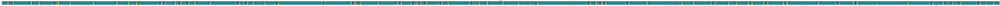

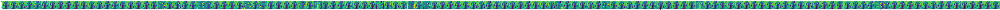

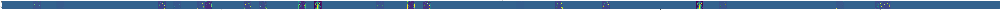

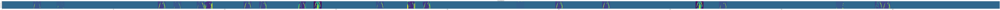

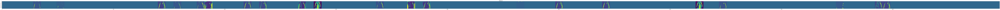

In [43]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.image import convert_image_dtype
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from matplotlib import pyplot


# Load the model
model = load_model('64x3-CNN.model')

# Get the output of each layer in the model
layer_outputs = [layer.output for layer in model.layers]
layer_names = [layer.name for layer in model.layers]

# Create the feature map model with the same input shape as the original model
feature_map_model = Model(inputs=model.input, outputs=layer_outputs)

image_path = '/Users/rohinv/Downloads/archive/val/opacity/chennaivirus.jpeg'
pil_image = load_img(image_path, target_size=(300, 300))
pil_image = Image.open(image_path)
resize_image=pil_image.resize((300,300))
img = resize_image.convert("L")

input_array = img_to_array(img)
input_array /= 255.0

# Convert RGB image to grayscale
img = convert_image_dtype(input_array, dtype=tf.float32)

# Expand dimensions to match the input shape of the feature map model
input_array = np.expand_dims(input_array, axis=0)

# Predict the feature maps
feature_maps = feature_map_model.predict(input_array)

for layer_name, feature_map in zip(layer_names, feature_maps):
    if len(feature_map.shape) == 4:
        k = feature_map.shape[-1]
        size = feature_map.shape[1]
        image_belt = np.zeros((298, k * size), dtype=np.uint8)  # Initialize with zeros or desired initial values
        for i in range(k):
            feature_image = feature_map[0, :, :, i]
            feature_image -= feature_image.mean()
            std = feature_image.std()
            if std > 1e-5:
                feature_image /= std
            else:
                feature_image = np.zeros_like(feature_image)
            feature_image *= 64
            feature_image += 128
            feature_image = np.clip(feature_image, 0, 255).astype('uint8')
            resized_feature_image = cv2.resize(feature_image, (size, 298))  # Resize feature_image
            image_belt[:, i * size : (i + 1) * size] = resized_feature_image

            scale = 300 / k
        plt.figure(figsize=(scale * k, scale))
        #plt.figure(figsize=(100,0.5))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(image_belt, aspect='auto')
        plt.show()

